<a href="https://colab.research.google.com/github/rheanijjer/rheanijjer/blob/main/vRN_AFM346_Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [161]:
#Part 1: Introduction
!pip install tensorflow
!pip install yfinance
#Import libraries:
import pandas as pd
import numpy as np
import yfinance as yf
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
import tensorflow as tf
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score


In [162]:
# Define parameters
start_date = '2022-01-15'
end_date = '2025-01-15'
tickers = ['CRM', 'UBER', 'MSFT', 'V', 'JPM', 'NFLX']

# Initialize an empty DataFrame for merging
final_df = pd.DataFrame()

for ticker in tickers:
    print(f"Downloading {ticker}...")
    df = yf.download(ticker, start=start_date, end=end_date)[['Close']]
    df = df.rename(columns={'Close': ticker})  # Rename 'Close' to ticker name
    df.index = pd.to_datetime(df.index)  # Ensure datetime format
    if final_df.empty:
        final_df = df
    else:
        final_df = final_df.join(df, how='outer')  # Merge on date

# Reset index to have 'Date' as a column
final_df = final_df.reset_index().rename(columns={'index': 'Date'})

# Preview result
print(final_df.head())

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Price        Date         CRM       UBER        MSFT           V         JPM  \
Ticker                    CRM       UBER        MSFT           V         JPM   
0      2022-01-18  224.804382  38.410000  294.408875  210.438507  139.190643   
1      2022-01-19  225.013199  37.860001  295.070374  209.433655  137.037476   
2      2022-01-20  221.701706  37.820000  293.387421  209.111740  135.868927   
3      2022-01-21  217.415634  35.939999  287.969147  200.897491  133.494919   
4      2022-01-24  221.791199  36.279999  288.299896  196.917221  133.375320   

Price         NFLX  
Ticker        NFLX  
0       510.799988  
1       515.859985  
2       508.250000  
3       397.500000  
4       387.149994  


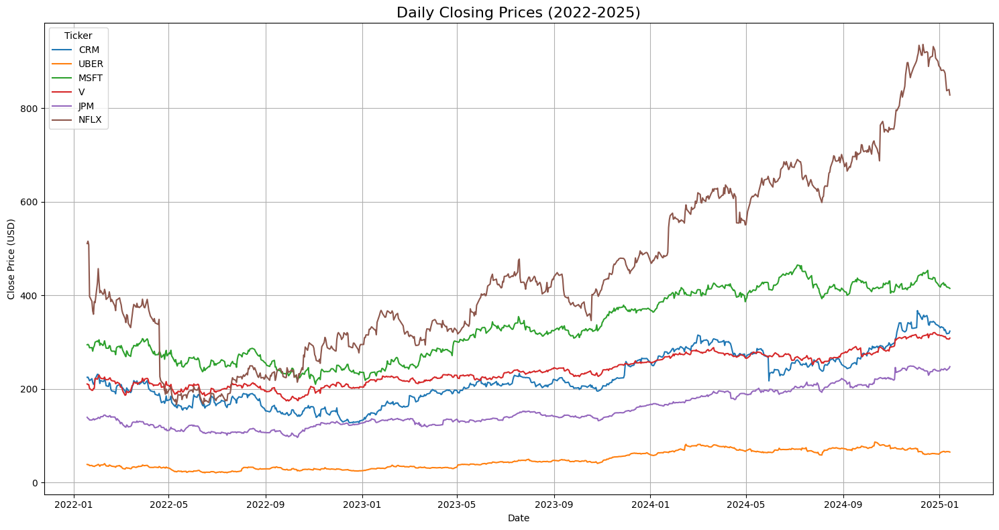

In [163]:
# Plot each ticker
plt.figure(figsize=(15, 8))
for ticker in ['CRM', 'UBER', 'MSFT', 'V', 'JPM', 'NFLX']:
    plt.plot(final_df['Date'], final_df[ticker], label=ticker)

# Add title and labels
plt.title('Daily Closing Prices (2022-2025)', fontsize=16)
plt.xlabel('Date')
plt.ylabel('Close Price (USD)')
plt.legend(title="Ticker")
plt.grid(True)
plt.tight_layout()
plt.show()

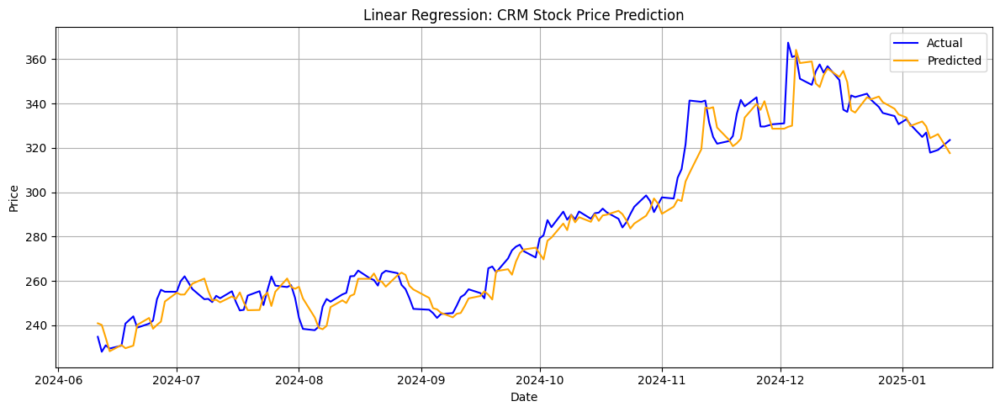

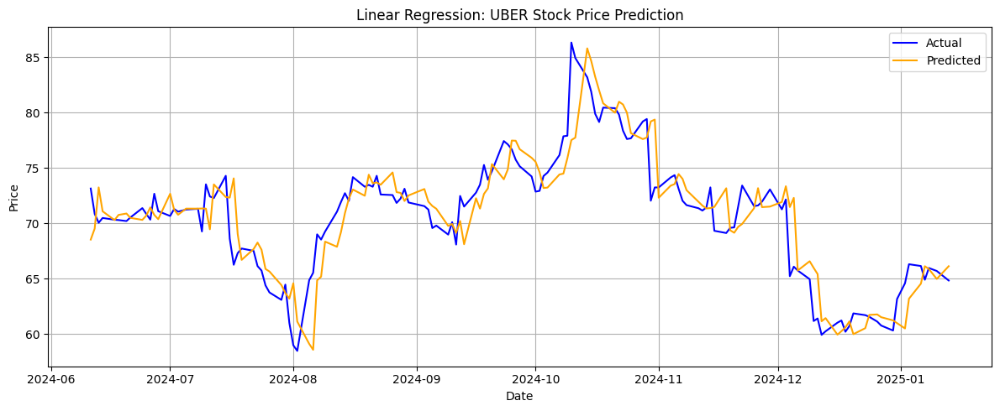

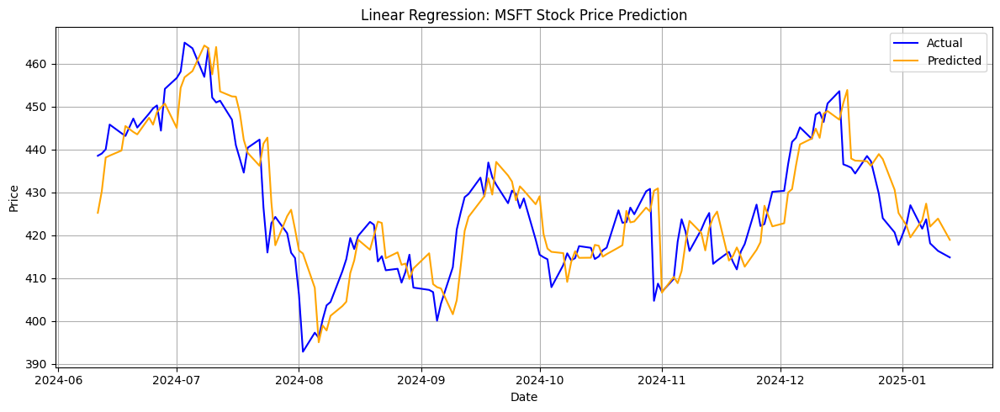

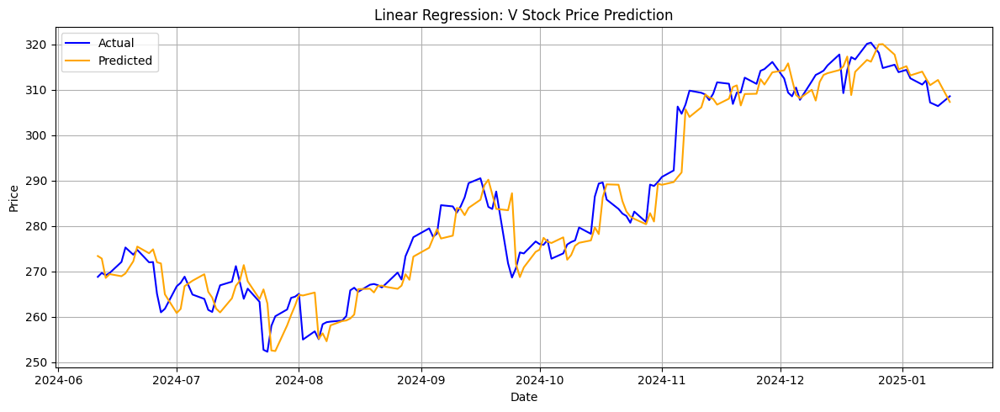

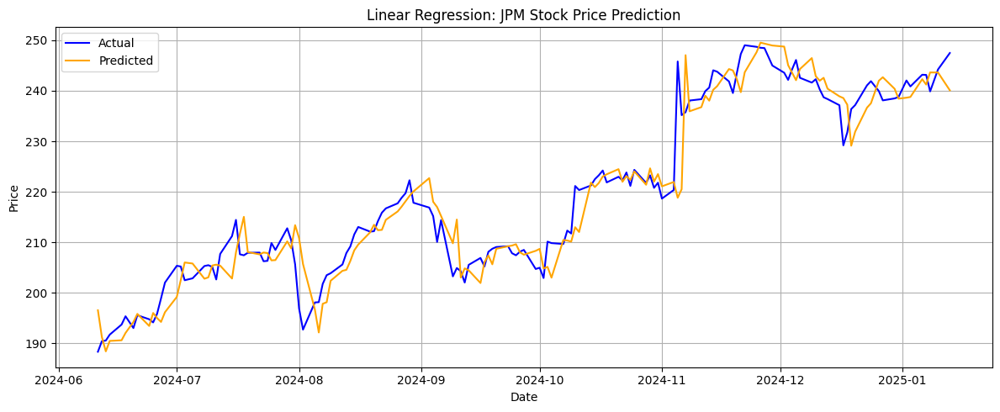

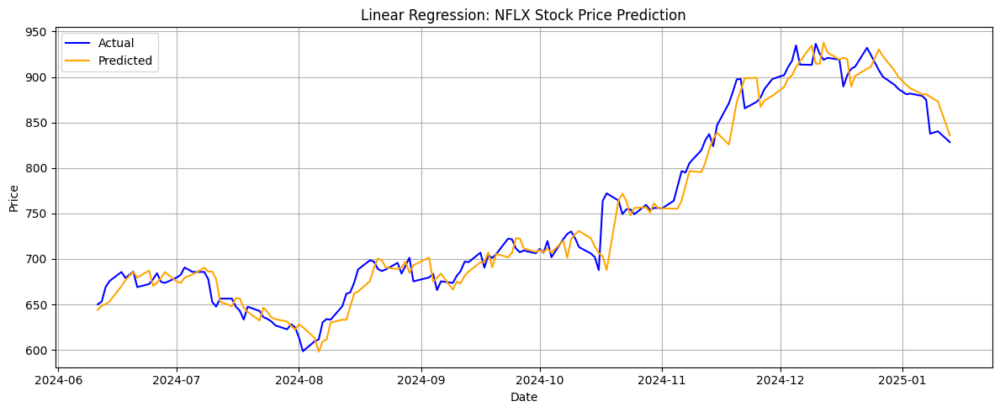

,MSE,R2
Ticker,,
CRM,73.008120,0.950808
UBER,6.377521,0.790872
MSFT,59.703096,0.747527
V,22.973193,0.943169
JPM,22.382042,0.921976
NFLX,315.121370,0.967340


In [164]:
df_lr = final_df.copy().dropna().reset_index(drop=True)
lr_results = {}

for ticker in ['CRM', 'UBER', 'MSFT', 'V', 'JPM', 'NFLX']:
    stock_df = df_lr[['Date', ticker]].copy()

    # Create lag features
    stock_df['Target'] = stock_df[ticker].shift(-1)
    stock_df['Lag_1'] = stock_df[ticker].shift(1)
    stock_df['Lag_5'] = stock_df[ticker].shift(5)
    stock_df['Lag_10'] = stock_df[ticker].shift(10)
    stock_df = stock_df.dropna().reset_index(drop=True)

    X = stock_df[['Lag_1', 'Lag_5', 'Lag_10']]
    y = stock_df['Target']

    X_train, X_test, y_train, y_test = train_test_split(X, y, shuffle=False, test_size=0.2)

    # Train model
    model = LinearRegression()
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # Store evaluation metrics
    MSE = mean_squared_error(y_test, y_pred)
    R2 = r2_score(y_test, y_pred)
    lr_results[ticker] = {'MSE': MSE, 'R2': R2}

    # Plot actual vs predicted
    plt.figure(figsize=(12, 5))
    plt.plot(stock_df['Date'].iloc[y_test.index], y_test, label='Actual', color='blue')
    plt.plot(stock_df['Date'].iloc[y_test.index], y_pred, label='Predicted', color='orange')
    plt.title(f'Linear Regression: {ticker} Stock Price Prediction')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Display metrics
results_df = pd.DataFrame(lr_results).T
results_df.index.name = 'Ticker'
display(results_df)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


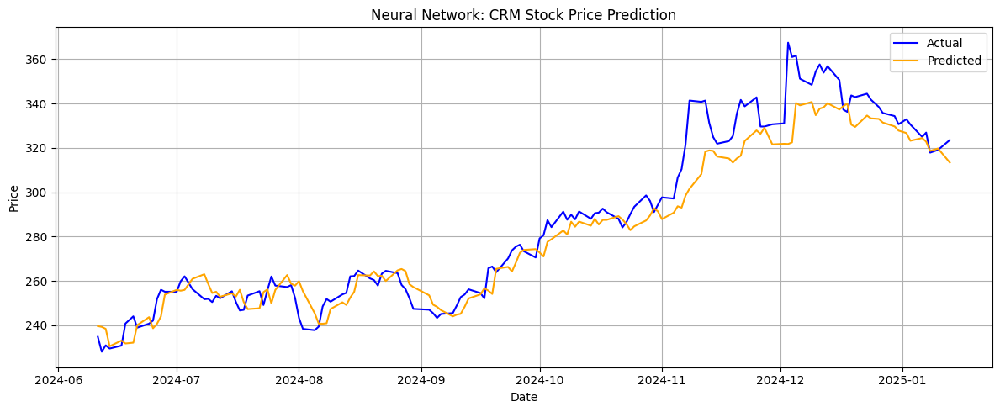

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


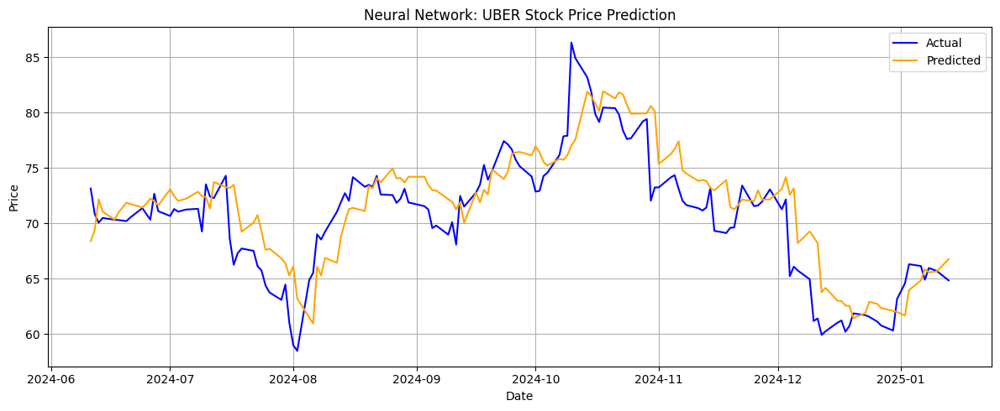

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


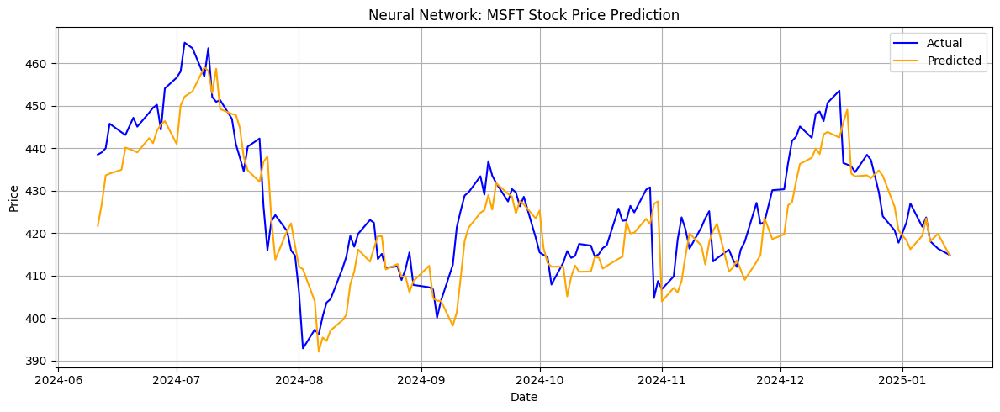

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


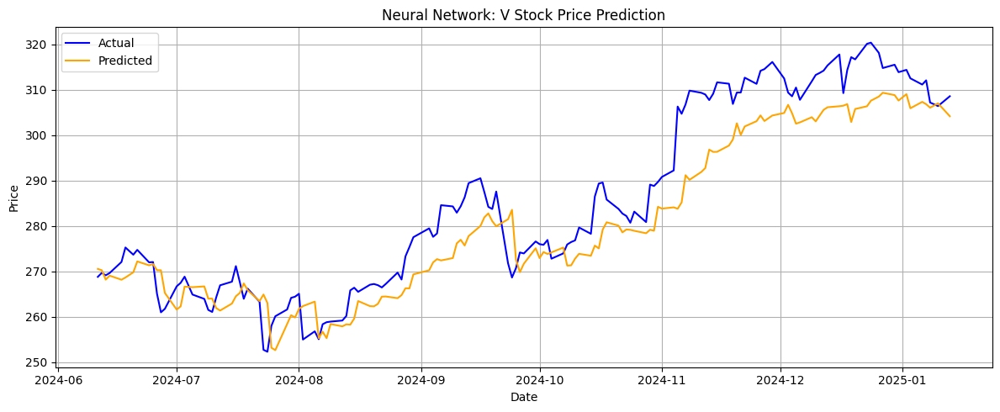

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


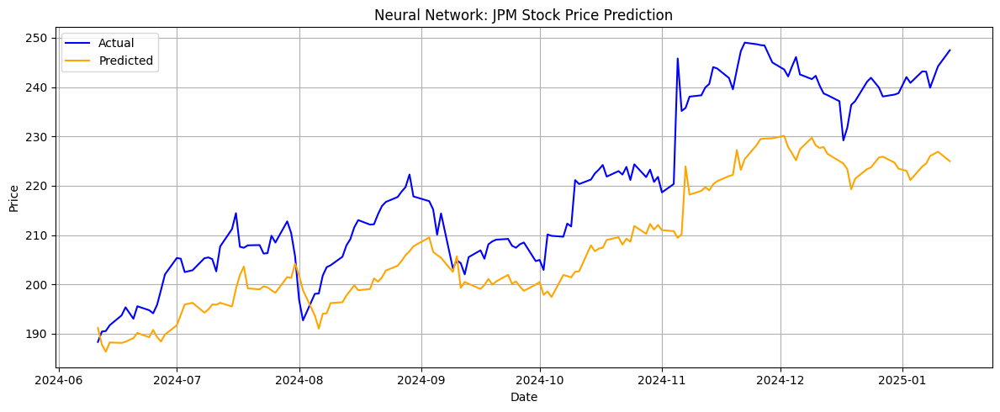

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


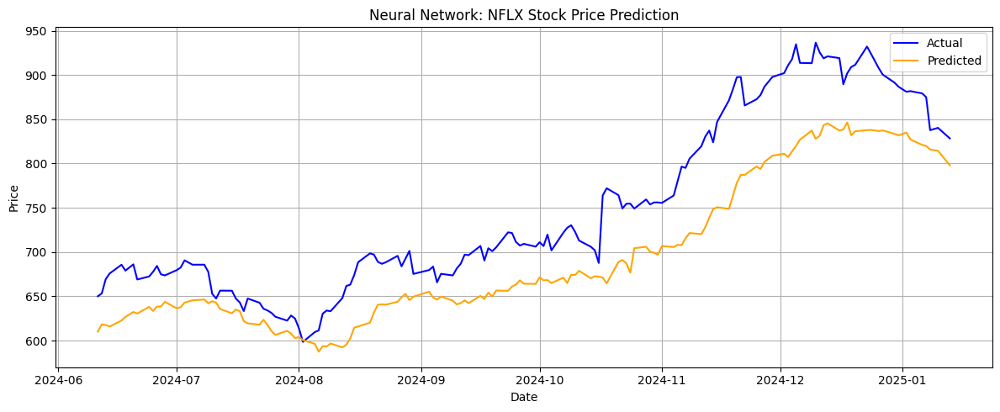

                MSE        R2
Ticker                       
CRM      116.430480  0.921551
UBER       8.968092  0.705924
MSFT      66.837266  0.717357
V         60.859393  0.849446
JPM      170.925259  0.404155
NFLX    3636.526630  0.623097


In [165]:
df_nn = final_df.copy().dropna().reset_index(drop=True)
nn_results = {}

for ticker in ['CRM', 'UBER', 'MSFT', 'V', 'JPM', 'NFLX']:
    stock_df = df_nn[['Date', ticker]].copy()

    # Feature engineering
    stock_df['Target'] = stock_df[ticker].shift(-1)
    stock_df['Lag_1'] = stock_df[ticker].shift(1)
    stock_df['Lag_5'] = stock_df[ticker].shift(5)
    stock_df['Lag_10'] = stock_df[ticker].shift(10)
    stock_df = stock_df.dropna().reset_index(drop=True)

    X = stock_df[['Lag_1', 'Lag_5', 'Lag_10']].values
    y = stock_df['Target'].values.reshape(-1, 1)

    # Scale features and target
    scaler_X = MinMaxScaler()
    scaler_y = MinMaxScaler()
    X_scaled = scaler_X.fit_transform(X)
    y_scaled = scaler_y.fit_transform(y)

    # Train-test split
    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, shuffle=False, test_size=0.2)

    # Build and train the Neural Network
    model = Sequential([
        Dense(64, activation='relu', input_shape=(X_train.shape[1],)),
        Dense(32, activation='relu'),
        Dense(1)
    ])

    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(X_train, y_train, epochs=50, batch_size=16, verbose=0, validation_split=0.2)

    y_pred_scaled = model.predict(X_test)
    y_pred = scaler_y.inverse_transform(y_pred_scaled)
    y_true = scaler_y.inverse_transform(y_test)

    MSE = mean_squared_error(y_true, y_pred)
    R2 = r2_score(y_true, y_pred)
    nn_results[ticker] = {'MSE': MSE, 'R2': R2}

    # Plot actual vs predicted
    plt.figure(figsize=(12, 5))
    plt.plot(stock_df['Date'].iloc[-len(y_true):], y_true, label='Actual', color='blue')
    plt.plot(stock_df['Date'].iloc[-len(y_true):], y_pred, label='Predicted', color='orange')
    plt.title(f'Neural Network: {ticker} Stock Price Prediction')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Print results
nn_results_df = pd.DataFrame(nn_results).T
nn_results_df.index.name = 'Ticker'
print(nn_results_df)


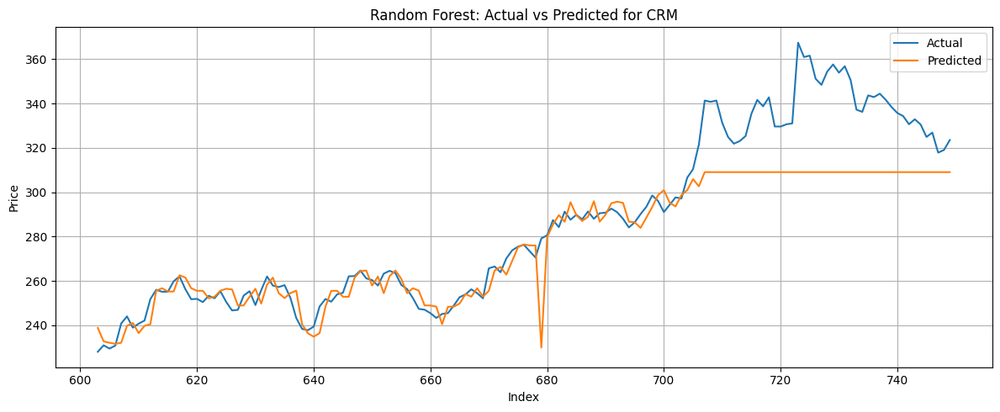

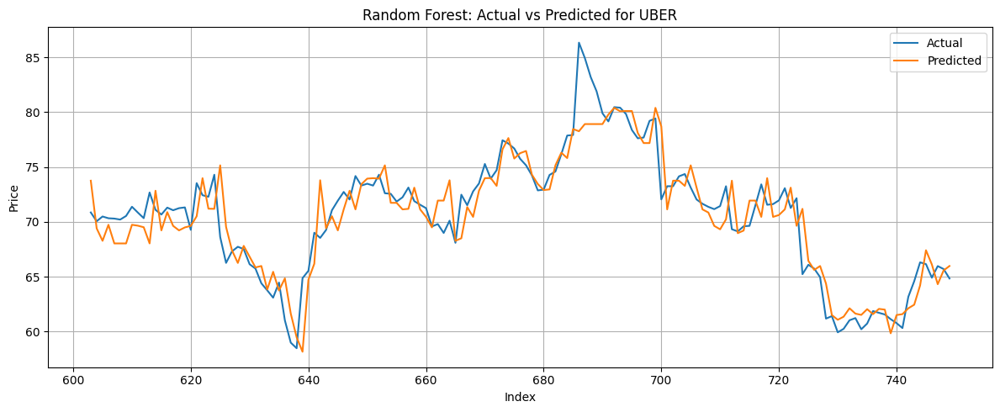

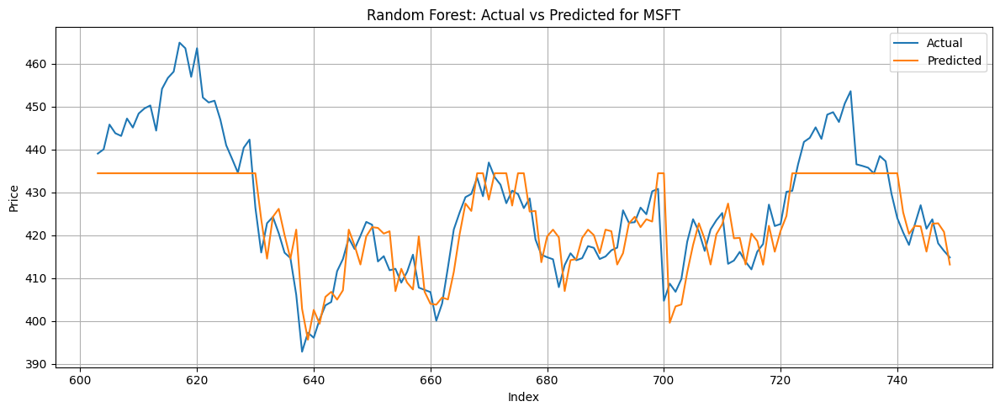

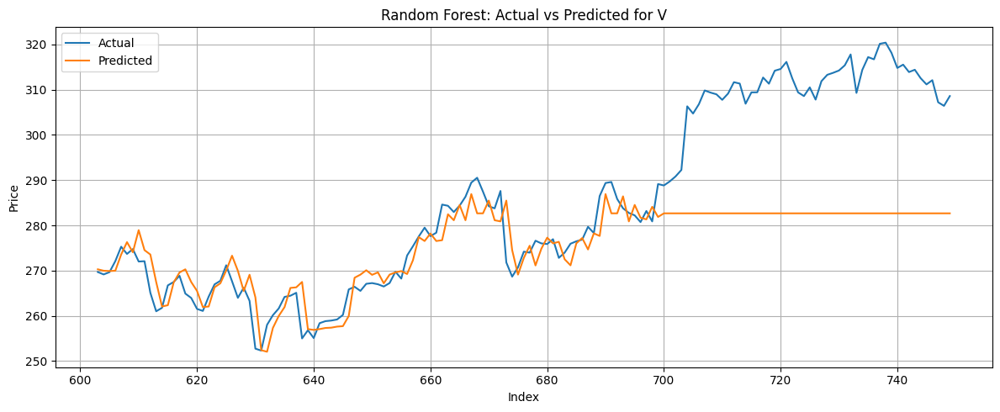

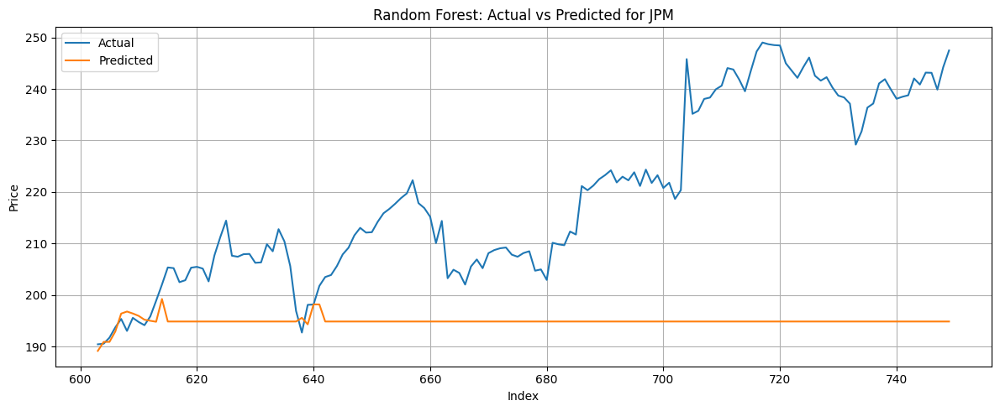

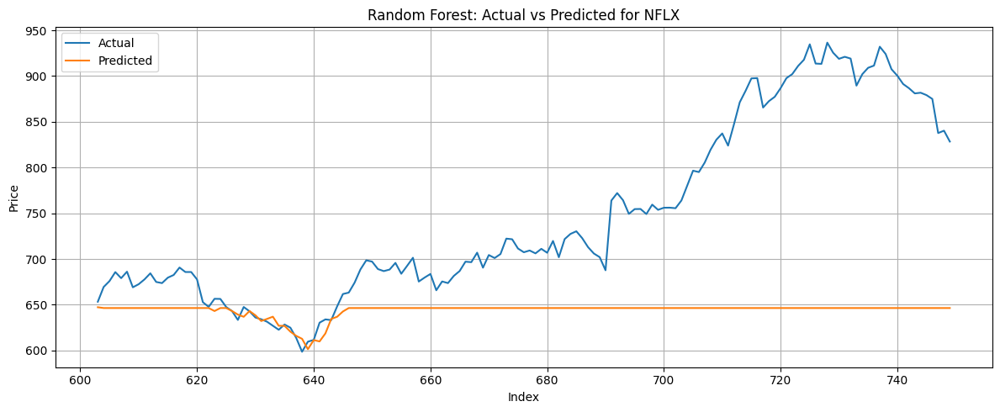

,MSE,R2
Ticker,,
CRM,330.835554,0.775970
UBER,4.789203,0.843790
MSFT,87.248001,0.631965
V,284.977848,0.296755
JPM,875.159785,-2.099342
NFLX,19740.341543,-1.045519


In [166]:
#random forest model
results_rf = {}
for ticker in ['CRM', 'UBER', 'MSFT', 'V', 'JPM', 'NFLX']:
    stock_data = final_df[['Date', ticker]].dropna().copy()
    stock_data['Target'] = stock_data[ticker].shift(-1)
    stock_data['Lag1'] = stock_data[ticker].shift(1)
    stock_data['Lag5'] = stock_data[ticker].shift(5)
    stock_data['MA5'] = stock_data[ticker].rolling(window=5).mean()
    stock_data['MA20'] = stock_data[ticker].rolling(window=20).mean()
    stock_data.dropna(inplace=True)

    X = stock_data[['Lag1', 'Lag5', 'MA5', 'MA20']]
    y = stock_data['Target']

    X = stock_data[[ticker]]
    y = stock_data['Target']
    X_train, X_test, y_train, y_test = train_test_split(X, y, shuffle=False, test_size=0.2)

    rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
    rf_model.fit(X_train, y_train)

    y_pred = rf_model.predict(X_test)
    MSE = mean_squared_error(y_test, y_pred)
    R2 = r2_score(y_test, y_pred)
    results_rf[ticker] = {'MSE': MSE, 'R2': R2}

    # Plot Actual vs Predicted
    plt.figure(figsize=(12, 5))
    plt.plot(y_test.index, y_test.values, label='Actual')
    plt.plot(y_test.index, y_pred, label='Predicted')
    plt.title(f'Random Forest: Actual vs Predicted for {ticker}')
    plt.xlabel('Index')
    plt.ylabel('Price')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Print results
rf_results_df = pd.DataFrame(results_rf).T
rf_results_df.index.name = 'Ticker'
display(rf_results_df)

Training Gradient Boosting for CRM...


/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_gb.py:672: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)  # TODO: Is this still required?


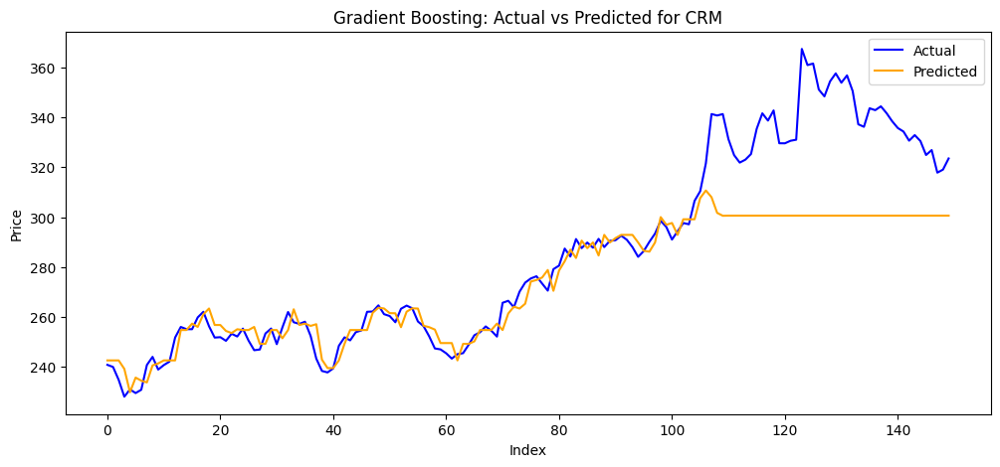

Training Gradient Boosting for UBER...


/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_gb.py:672: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)  # TODO: Is this still required?


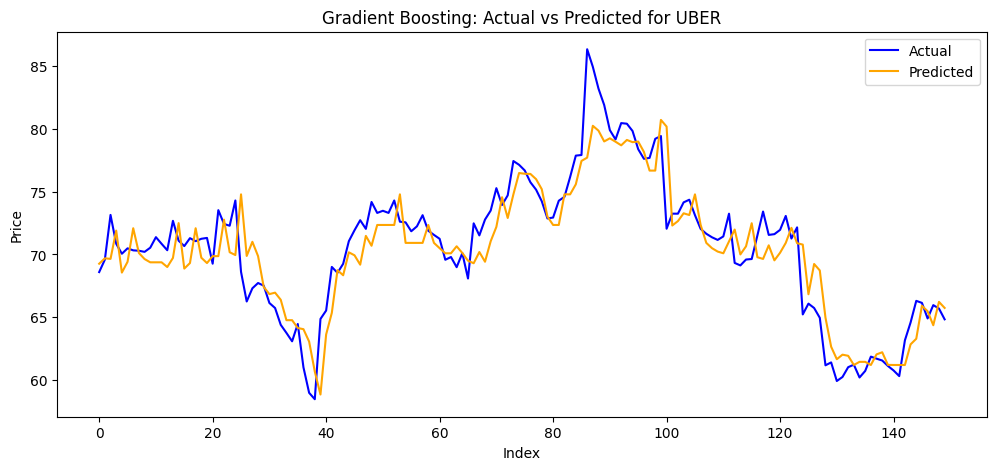

Training Gradient Boosting for MSFT...


/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_gb.py:672: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)  # TODO: Is this still required?


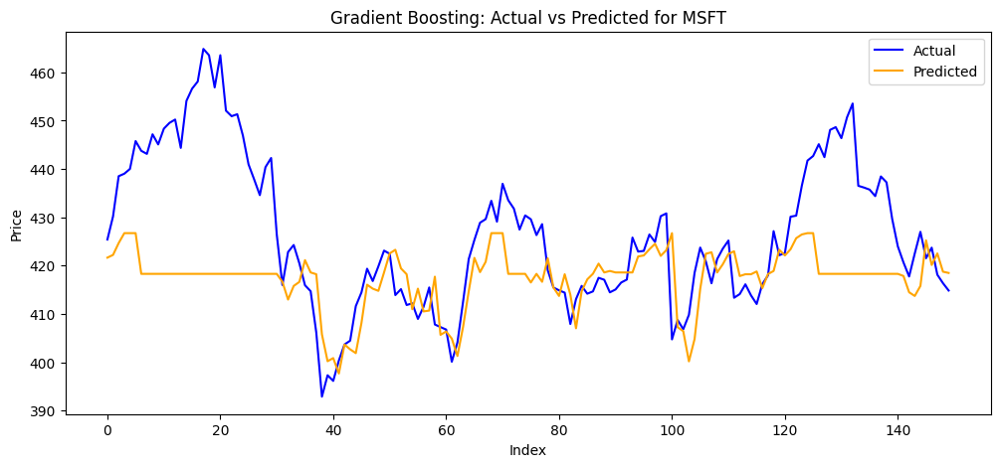

Training Gradient Boosting for V...


/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_gb.py:672: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)  # TODO: Is this still required?


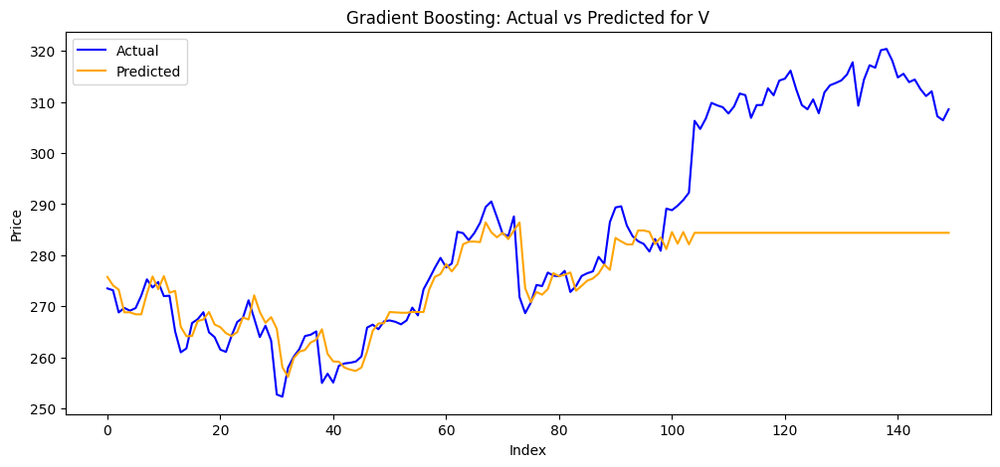

Training Gradient Boosting for JPM...


/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_gb.py:672: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)  # TODO: Is this still required?


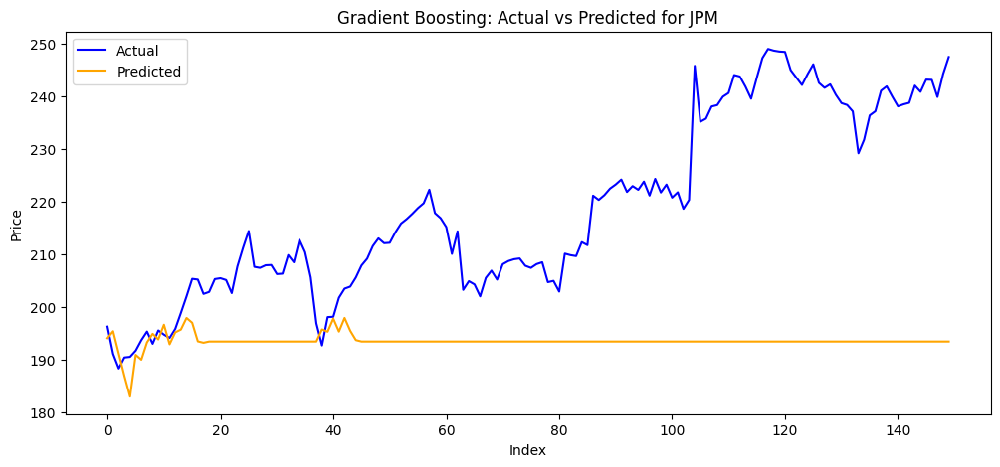

Training Gradient Boosting for NFLX...


/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_gb.py:672: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)  # TODO: Is this still required?


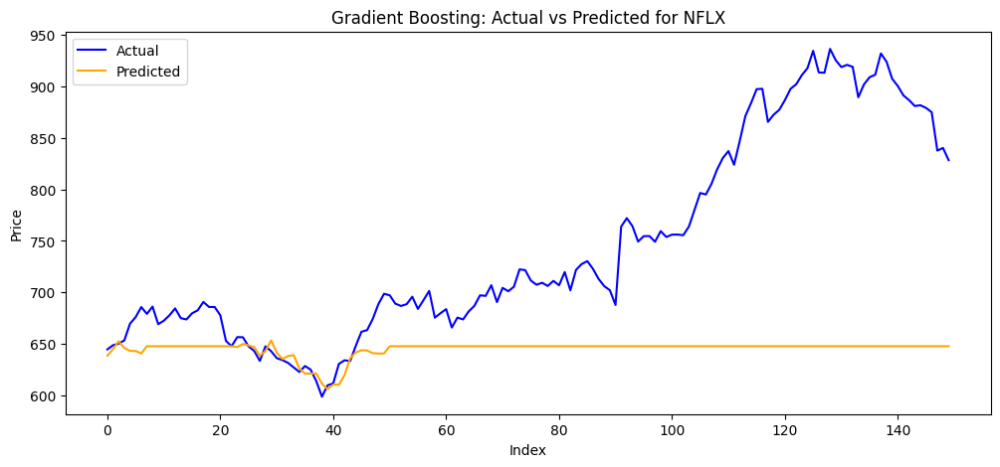

,MSE,R2
Ticker,,
CRM,330.835554,0.775970
UBER,4.789203,0.843790
MSFT,87.248001,0.631965
V,284.977848,0.296755
JPM,875.159785,-2.099342
NFLX,19740.341543,-1.045519


In [167]:
# Gradient Boosting model for each ticker
window_size = 5
tickers = ['CRM', 'UBER', 'MSFT', 'V', 'JPM', 'NFLX']
results_gb = {}

for ticker in tickers:
    print(f"Training Gradient Boosting for {ticker}...")

    df = final_df[['Date', ticker]].dropna().copy()
    df[ticker] = df[ticker].astype(float)

    # Create lag features
    for lag in range(1, window_size + 1):
        df[f'lag_{lag}'] = df[ticker].shift(lag)

    df.dropna(inplace=True)

    # Split features and target
    X = df[[f'lag_{lag}' for lag in range(1, window_size + 1)]]
    y = df[ticker]

    # Train-test split (80/20)
    split_idx = int(len(df) * 0.8)
    X_train, X_test = X[:split_idx], X[split_idx:]
    y_train, y_test = y[:split_idx], y[split_idx:]

    # Train model
    gb_model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=3)
    gb_model.fit(X_train, y_train)

    # Metrics
    y_pred = gb_model.predict(X_test)
    MSE = mean_squared_error(y_test, y_pred)
    R2 = r2_score(y_test, y_pred)
    results_gb[ticker] = {'MSE': MSE, 'R2': R2}

    # Plot actual vs predicted
    plt.figure(figsize=(12, 5))
    plt.plot(y_test.values, label='Actual', color='blue')
    plt.plot(y_pred, label='Predicted', color='orange')
    plt.title(f"Gradient Boosting: Actual vs Predicted for {ticker}")
    plt.xlabel("Index")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

#Print Results
rf_results_df = pd.DataFrame(results_rf).T
rf_results_df.index.name = 'Ticker'
display(rf_results_df)


Training SVM model for CRM...


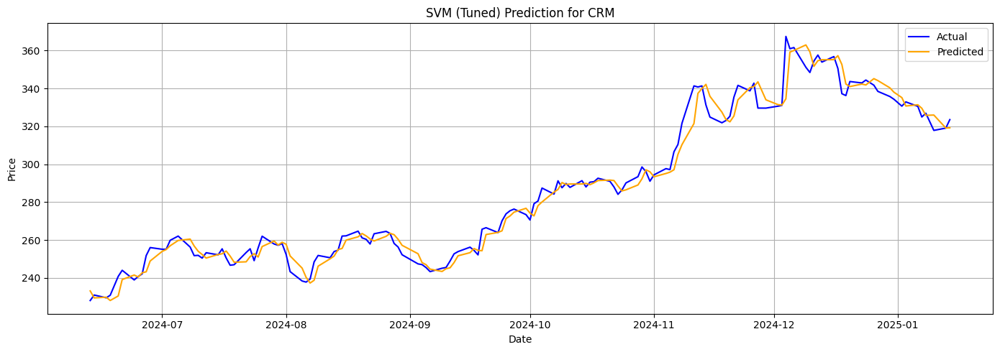

Training SVM model for UBER...


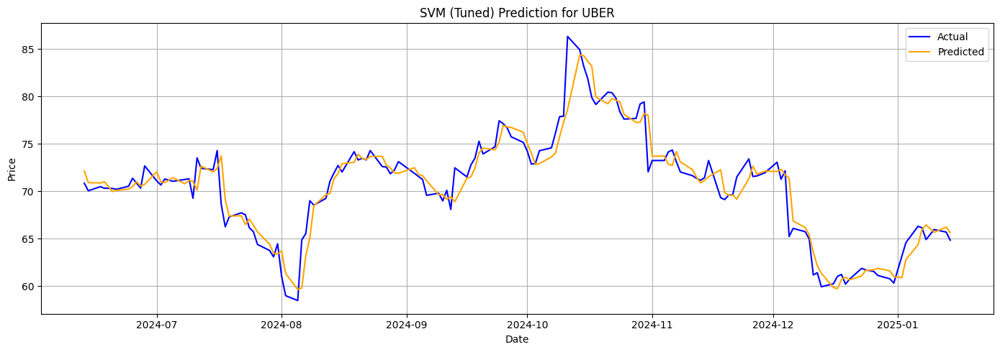

Training SVM model for MSFT...


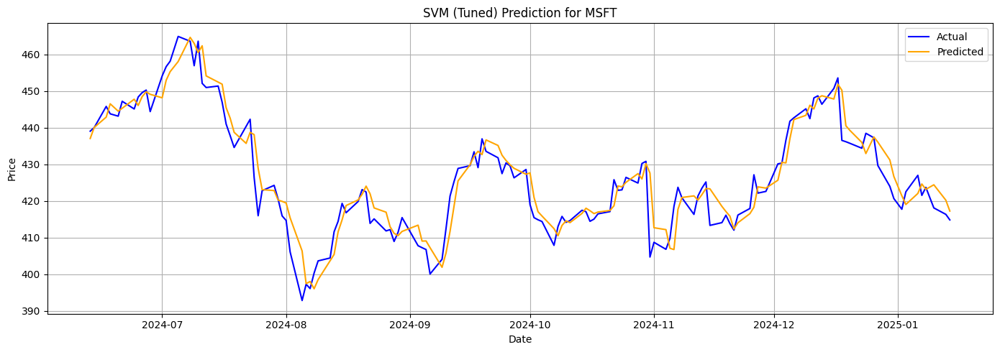

Training SVM model for V...


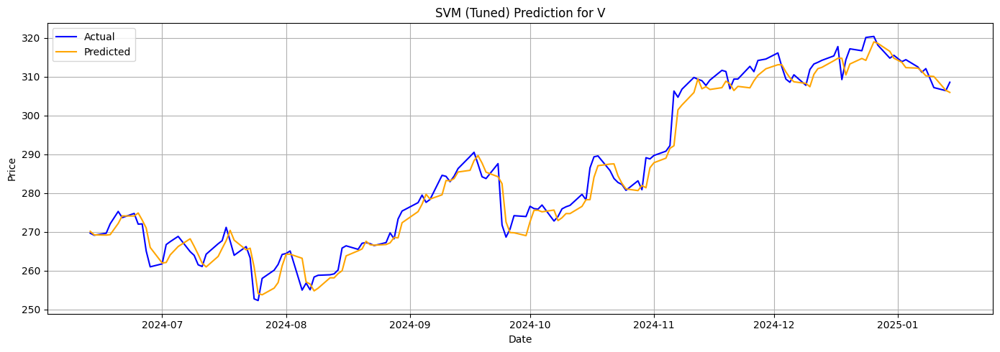

Training SVM model for JPM...


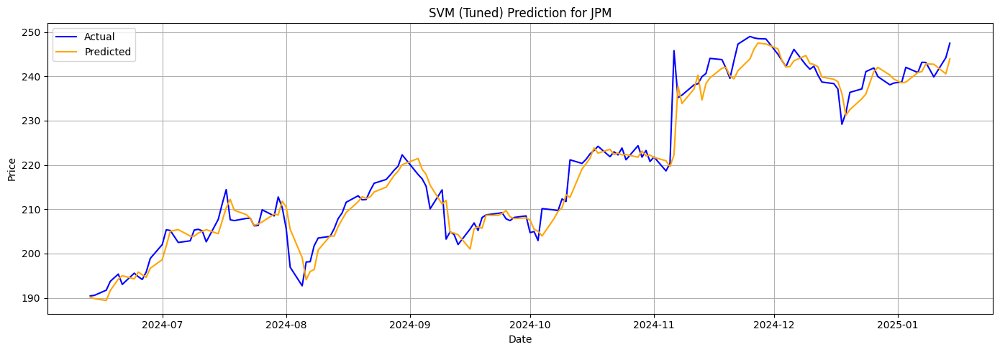

Training SVM model for NFLX...


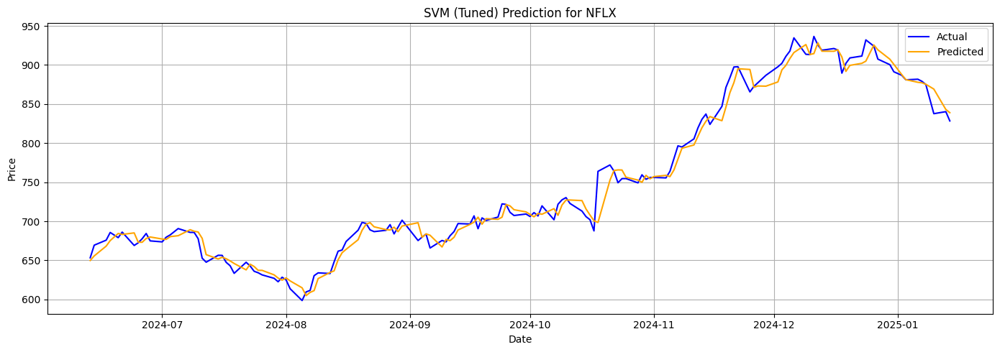

,MSE,R2
Ticker,,
CRM,32.465764,0.978015
UBER,2.748116,0.910364
MSFT,24.124517,0.898236
V,10.828988,0.973277
JPM,11.107655,0.960663
NFLX,139.046475,0.985592


In [168]:
# Make a copy of your data
df_svm = final_df.copy()
df_svm['Date'] = pd.to_datetime(df_svm['Date'])  # Ensure datetime
df_svm.set_index('Date', inplace=True)

# Define tickers
tickers = ['CRM', 'UBER', 'MSFT', 'V', 'JPM', 'NFLX']
results_svm = {}

# Loop through each ticker
for ticker in tickers:
    print(f"Training SVM model for {ticker}...")

    # Step 1: Create a per-ticker DataFrame
    df = pd.DataFrame()
    df['Close'] = df_svm[ticker]
    df['Return'] = df['Close'].pct_change()
    df['MA_5'] = df['Close'].rolling(window=5).mean()
    df['MA_20'] = df['Close'].rolling(window=20).mean()
    df['Volatility'] = df['Return'].rolling(window=20).std()
    df['Lag_1'] = df['Close'].shift(1)
    df['Lag_5'] = df['Close'].shift(5)
    df['Lag_10'] = df['Close'].shift(10)
    df.dropna(inplace=True)

    # Step 2: Define features/target
    features = ['MA_5', 'MA_20', 'Volatility', 'Lag_1', 'Lag_5', 'Lag_10']
    target = 'Close'
    X = df[features]
    y = df[target]

    # Step 3: Scale features/target
    scaler_X = MinMaxScaler()
    scaler_y = MinMaxScaler()
    X_scaled = scaler_X.fit_transform(X)
    y_scaled = scaler_y.fit_transform(y.values.reshape(-1, 1))

    # Step 4: Split data
    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.2, shuffle=False)

    # Step 5: Train tuned SVM model
    model = SVR(kernel='rbf', C=100, gamma=0.01, epsilon=0.01)
    model.fit(X_train, y_train.ravel())

    # Step 6: Predict
    y_pred_scaled = model.predict(X_test).reshape(-1, 1)
    y_pred = scaler_y.inverse_transform(y_pred_scaled)
    y_test_actual = scaler_y.inverse_transform(y_test)

    # Step 7: Evaluate & Save results
    MSE = mean_squared_error(y_test_actual, y_pred)
    R2 = r2_score(y_test_actual, y_pred)
    results_svm[ticker] = {'MSE': MSE, 'R2': R2}

    # Step 8: Plot
    plt.figure(figsize=(14, 5))
    date_index = df.index[-len(y_test):]
    plt.plot(date_index, y_test_actual, label='Actual', color='blue')
    plt.plot(date_index, y_pred, label='Predicted', color='orange')
    plt.title(f'SVM (Tuned) Prediction for {ticker}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Print results
svm_results_df = pd.DataFrame(results_svm).T
svm_results_df.index.name = 'Ticker'
display(svm_results_df)

In [169]:
summary_dfs = []

# Append each model's results dataframe to the list, adding a 'Model' column
summary_dfs.append(results_df.reset_index().assign(Model='Linear Regression'))
summary_dfs.append(nn_results_df.reset_index().assign(Model='Neural Network'))
summary_dfs.append(svm_results_df.reset_index().assign(Model='SVM'))
summary_dfs.append(rf_results_df.reset_index().assign(Model='Random Forest'))
summary_dfs.append(summary_df.assign(Model='Gradient Boosting'))

merged_summary = pd.concat(summary_dfs, ignore_index=True)
merged_summary


,Ticker,MSE,R2,Model
0,CRM,73.008120,0.950808,Linear Regression
1,UBER,6.377521,0.790872,Linear Regression
2,MSFT,59.703096,0.747527,Linear Regression
3,V,22.973193,0.943169,Linear Regression
4,JPM,22.382042,0.921976,Linear Regression
5,NFLX,315.121370,0.967340,Linear Regression
6,CRM,116.430480,0.921551,Neural Network
7,UBER,8.968092,0.705924,Neural Network
8,MSFT,66.837266,0.717357,Neural Network
9,V,60.859393,0.849446,Neural Network


#Analysis of SVM (Top-Performing Model)

In [170]:
#Use LIME to get some insights into the explainability of this model, given it is the best performing model in this analysis, but is also a black box model, it is important to use tools to explain the model

!pip install lime
import lime
from lime import lime_tabular

# Step 1: Create the LIME explainer
explainer = lime_tabular.LimeTabularExplainer(
    training_data=X_train,
    feature_names=features,
    class_names=['Price'],
    mode='regression',
    discretize_continuous=True
)

# Step 2: Loop through first 5 samples
for i in range(5):
    print(f"LIME Explanation for Test Sample #{i}")

    exp = explainer.explain_instance(
        X_test[i],
        model.predict,
        num_features=6
    )

    exp.show_in_notebook()

# Step 9: Predict 1-year ahead return using last known feature row
print("Predicted 1-Year Returns:")
for ticker in tickers:
    # Recreate features for the ticker
    df = pd.DataFrame()
    df['Close'] = df_svm[ticker]
    df['Return'] = df['Close'].pct_change()
    df['MA_5'] = df['Close'].rolling(window=5).mean()
    df['MA_20'] = df['Close'].rolling(window=20).mean()
    df['Volatility'] = df['Return'].rolling(window=20).std()
    df['Lag_1'] = df['Close'].shift(1)
    df['Lag_5'] = df['Close'].shift(5)
    df['Lag_10'] = df['Close'].shift(10)
    df.dropna(inplace=True)

    # Latest row
    latest_features = df[features].iloc[-1:]
    latest_actual_price = df['Close'].iloc[-1]

    # Scale with same scalers used earlier
    X_latest_scaled = scaler_X.transform(latest_features)
    predicted_price_scaled = model.predict(X_latest_scaled).reshape(-1, 1)
    predicted_price = scaler_y.inverse_transform(predicted_price_scaled)[0][0]

    # Calculate return
    predicted_return = ((predicted_price - latest_actual_price) / latest_actual_price) * 100
    print(f"{ticker}: Predicted Price = ${predicted_price:.2f}, Latest Price = ${latest_actual_price:.2f}, 1-Year Return = {predicted_return:.2f}%")

LIME Explanation for Test Sample #0


LIME Explanation for Test Sample #1


LIME Explanation for Test Sample #2


LIME Explanation for Test Sample #3


LIME Explanation for Test Sample #4


Predicted 1-Year Returns:
CRM: Predicted Price = $318.89, Latest Price = $323.54, 1-Year Return = -1.44%
UBER: Predicted Price = $69.85, Latest Price = $64.84, 1-Year Return = 7.73%
MSFT: Predicted Price = $415.83, Latest Price = $414.84, 1-Year Return = 0.24%
V: Predicted Price = $306.21, Latest Price = $308.57, 1-Year Return = -0.76%
JPM: Predicted Price = $244.23, Latest Price = $247.47, 1-Year Return = -1.31%
NFLX: Predicted Price = $838.96, Latest Price = $828.40, 1-Year Return = 1.28%


#Portfolio Allocations

In [171]:
# List of ticker symbols
tickers = ["CRM", "UBER", "MSFT", "V", "JPM", "NFLX"]

# Dictionary to store beta values
beta_values = {}

for ticker in tickers:
   stock = yf.Ticker(ticker)
   beta = stock.info.get('beta')
   if beta is not None:
       beta_values[ticker] = beta
   else:
       beta_values[ticker] = 'Beta value not available'

# Display the beta values
for ticker, beta in beta_values.items():
   print(f"{ticker}: {beta}")


CRM: 1.381
UBER: 1.366
MSFT: 1.0
V: 0.943
JPM: 1.005
NFLX: 1.547


In [172]:
# Example data (replace with your SVM predictions)
data = {'Ticker': ['CRM', 'UBER', 'MSFT', 'V', 'JPM', 'NFLX'],
        'Predicted_Return': [-1.44, 7.73, 0.24, -0.76, -1.31, 1.28],
        'Beta': [1.381, 1.366, 1.0, 0.943, 1.005, 1.547]} #Example Beta values. Replace with your actual beta values.
svm_results_df = pd.DataFrame(data)

positive_performers = svm_results_df[svm_results_df['Predicted_Return'] > 0] # Filter out underperforming stocks
positive_performers['Risk_Adjusted_Score'] = positive_performers['Predicted_Return'] / positive_performers['Beta'] # Calculate risk-adjusted score
total_score = positive_performers['Risk_Adjusted_Score'].sum() # Normalize the score to get portfolio weights
positive_performers['Weight'] = positive_performers['Risk_Adjusted_Score'] / total_score
investment_amount = 1000000# Calculate investment amounts
positive_performers['Investment'] = positive_performers['Weight'] * investment_amount

# Display investment recommendations
print(positive_performers[['Ticker', 'Predicted_Return', 'Beta','Risk_Adjusted_Score', 'Weight', 'Investment']])


  Ticker  Predicted_Return   Beta  Risk_Adjusted_Score    Weight  \
1   UBER              7.73  1.366             5.658858  0.841308   
2   MSFT              0.24  1.000             0.240000  0.035681   
5   NFLX              1.28  1.547             0.827408  0.123011   

      Investment  
1  841307.508871  
2   35681.016004  
5  123011.475126  


<ipython-input-172-c63c6803e687>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  positive_performers['Risk_Adjusted_Score'] = positive_performers['Predicted_Return'] / positive_performers['Beta'] # Calculate risk-adjusted score
<ipython-input-172-c63c6803e687>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  positive_performers['Weight'] = positive_performers['Risk_Adjusted_Score'] / total_score
<ipython-input-172-c63c6803e687>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice 